In [1]:
import tensorflow as tf
import pathlib
import matplotlib.pyplot as plt
import zipfile
import PIL
import csv
import numpy as np

In [2]:
# Extract the image files
with zipfile.ZipFile('/tmp/split_dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('/tmp/split_dataset')

In [3]:
# Dataset directories of train dataset, validation dataset and test dataset
train_dataset_directory = pathlib.Path('/tmp/split_dataset/split_dataset/train')
validation_dataset_directory = pathlib.Path('/tmp/split_dataset/split_dataset/val')
test_dataset_directory = pathlib.Path('/tmp/split_dataset/split_dataset/test')

In [4]:
# Print size of train dataset, validation dataset and test dataset
print('Train dataset count:', len(list(train_dataset_directory.glob('*/*'))))
print('Validation dataset count:', len(list(validation_dataset_directory.glob('*/*'))))
print('Test dataset count:', len(list(test_dataset_directory.glob('*/*'))))

Train dataset count: 766
Validation dataset count: 155
Test dataset count: 156


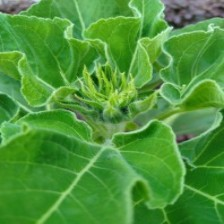

In [5]:
# Display sunflower bud image
buds = list(train_dataset_directory.glob('1. Bud/*'))
PIL.Image.open(str(buds[0]))

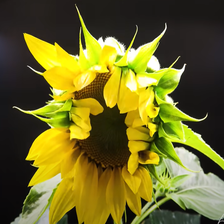

In [6]:
# Display partially bloom sunflower image
partially_blooms = list(train_dataset_directory.glob('2. Partially Bloom/*'))
PIL.Image.open(str(partially_blooms[0]))

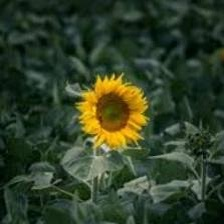

In [7]:
# Display fully bloom sunflower image
fully_blooms = list(train_dataset_directory.glob('3. Fully bloom/*'))
PIL.Image.open(str(fully_blooms[0]))

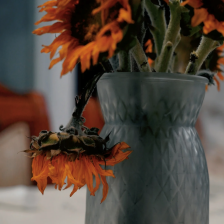

In [8]:
# Display wilt sunflower image
wilts = list(train_dataset_directory.glob('4. Wilt/*'))
PIL.Image.open(str(wilts[0]))

In [5]:
# Load train dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dataset_directory,
    image_size = (224, 224),
    batch_size = 32
)

Found 766 files belonging to 4 classes.


In [6]:
# Load validation dataset
validation_dataset = tf.keras.utils.image_dataset_from_directory(
    validation_dataset_directory,
    image_size = (224, 224),
    batch_size = 32
)

Found 155 files belonging to 4 classes.


In [7]:
# Load test dataset
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dataset_directory,
    image_size = (224, 224),
    batch_size = 32
)

Found 156 files belonging to 4 classes.


In [8]:
# Print class names
print('Train dataset class names:', train_dataset.class_names)
print('Validation dataset class names:', validation_dataset.class_names)
print('Test dataset class names:', test_dataset.class_names)

Train dataset class names: ['1. Bud', '2. Partially Bloom', '3. Fully bloom', '4. Wilt']
Validation dataset class names: ['1. Bud', '2. Partially Bloom', '3. Fully bloom', '4. Wilt']
Test dataset class names: ['1. Bud', '2. Partially Bloom', '3. Fully bloom', '4. Wilt']


In [9]:
# Allow fetch dataset from cache
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(buffer_size = AUTOTUNE)
test_dataset = test_dataset.cache().prefetch(buffer_size = AUTOTUNE)

In [14]:
# Load base model (Adam optimizer, freeze 100%)
base_model_Adam_freeze_100 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [15]:
# Freeze the base model
base_model_Adam_freeze_100.trainable = False

In [16]:
# Build the model (Adam optimizer, freeze 100%, with data augmentation)
inputs_Adam_freeze_100 = tf.keras.Input(shape = (224, 224, 3))
x_Adam_freeze_100 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adam_freeze_100)  # Randomly flip the image horizontally
x_Adam_freeze_100 = tf.keras.layers.RandomRotation(0.2)(x_Adam_freeze_100)   # Randomly rotate the image
x_Adam_freeze_100 = tf.keras.layers.RandomContrast(0.2)(x_Adam_freeze_100)   # Randomly adjust the contrast
x_Adam_freeze_100 = tf.keras.applications.inception_v3.preprocess_input(x_Adam_freeze_100)  # Data pre-processing layer of Inception V3
x_Adam_freeze_100 = base_model_Adam_freeze_100(x_Adam_freeze_100, training = False)   # Inception V3
x_Adam_freeze_100 = tf.keras.layers.Dropout(0.2)(x_Adam_freeze_100)   # Drop out layer (drop 20%)
x_Adam_freeze_100 = tf.keras.layers.Flatten()(x_Adam_freeze_100)
x_Adam_freeze_100 = tf.keras.layers.Dense(500, activation='relu')(x_Adam_freeze_100)
x_Adam_freeze_100 = tf.keras.layers.Dense(200, activation='relu')(x_Adam_freeze_100)
outputs_Adam_freeze_100 = tf.keras.layers.Dense(4, activation='softmax')(x_Adam_freeze_100)
model_Adam_freeze_100 = tf.keras.Model(inputs_Adam_freeze_100, outputs_Adam_freeze_100)

In [17]:
model_Adam_freeze_100.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 25,701,504 (98.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

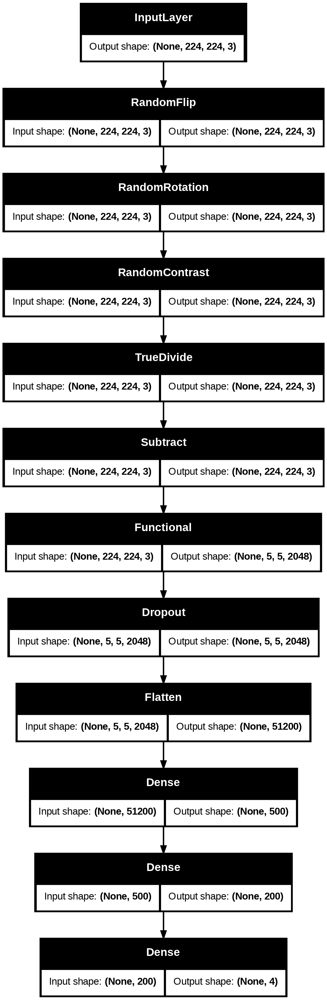

In [18]:
# Model structure
tf.keras.utils.plot_model(model_Adam_freeze_100, show_shapes = True)

In [19]:
# Compile model with Adam optimizer (freeze 100%) with learning rate of 0.0001
model_Adam_freeze_100.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [20]:
# Train model (10 epochs)
histories_Adam_freeze_100 = model_Adam_freeze_100.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 143s 5s/step - accuracy: 0.5894 - loss: 1.4284 - val_accuracy: 0.9161 - val_loss: 0.2649
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 119s 5s/step - accuracy: 0.9077 - loss: 0.2536 - val_accuracy: 0.8774 - val_loss: 0.3420
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 126s 5s/step - accuracy: 0.9343 - loss: 0.2214 - val_accuracy: 0.9161 - val_loss: 0.2239
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 148s 6s/step - accuracy: 0.9562 - loss: 0.1649 - val_accuracy: 0.8968 - val_loss: 0.2580
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 131s 5s/step - accuracy: 0.9440 - loss: 0.1494 - val_accuracy: 0.9419 - val_loss: 0.1784
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 123s 5s/step - accuracy: 0.9600 - loss: 0.0937 - val_accuracy: 0.8903 - val_loss: 0.4312
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 119s 5s/step - accuracy: 0.9477 - loss: 0.1537 - val_accuracy: 0.9613 - val_loss: 0.1197
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 127s 5s/step - accuracy: 0.9621 - loss: 0.1333 - val_accuracy: 0.9032 - v

In [21]:
# Save the model
model_Adam_freeze_100.save('/tmp/inception_v3_Adam_freeze_100_epoch_10.keras')

In [22]:
histories_Adam_freeze_100.history

{'accuracy': [0.7336814403533936,
  0.915143609046936,
  0.939947783946991,
  0.9464752078056335,
  0.9556135535240173,
  0.9543080925941467,
  0.9556135535240173,
  0.9516971111297607,
  0.9608355164527893,
  0.9621409773826599],
 'loss': [0.8938927054405212,
  0.23964644968509674,
  0.17866277694702148,
  0.1715882271528244,
  0.12591060996055603,
  0.11470194905996323,
  0.1382286697626114,
  0.15023267269134521,
  0.09447211027145386,
  0.11486339569091797],
 'val_accuracy': [0.9161290526390076,
  0.8774193525314331,
  0.9161290526390076,
  0.896774172782898,
  0.9419354796409607,
  0.8903225660324097,
  0.9612902998924255,
  0.9032257795333862,
  0.9612902998924255,
  0.9161290526390076],
 'val_loss': [0.2649339735507965,
  0.34200936555862427,
  0.22391505539417267,
  0.25800594687461853,
  0.17841549217700958,
  0.43117085099220276,
  0.11967185139656067,
  0.24170979857444763,
  0.17504200339317322,
  0.26015448570251465]}

In [24]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adam_freeze_100 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adam_freeze_100 = []

# Load to dictionary
for i in range(10):
    data_Adam_freeze_100.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adam_freeze_100.history['accuracy'][i],
        'Training loss': histories_Adam_freeze_100.history['loss'][i],
        'Validation accuracy': histories_Adam_freeze_100.history['val_accuracy'][i],
        'Validation loss': histories_Adam_freeze_100.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adam_freeze_100.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adam_freeze_100)
    writer.writeheader()
    writer.writerows(data_Adam_freeze_100)

In [25]:
# Test the model
loss_Adam_freeze_100, accuracy_Adam_freeze_100 = model_Adam_freeze_100.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adam_freeze_100)
print('Test loss:', loss_Adam_freeze_100)

5/5 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - accuracy: 0.9041 - loss: 0.3118
Test accuracy: 0.9166666865348816
Test loss: 0.3048219680786133


In [27]:
# Save test accuracy and test loss in csv file
with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    writer.writerow({'Model': 'Adam, freeze 100%, with data augmentation','Test accuracy': accuracy_Adam_freeze_100, 'Test loss': loss_Adam_freeze_100})

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


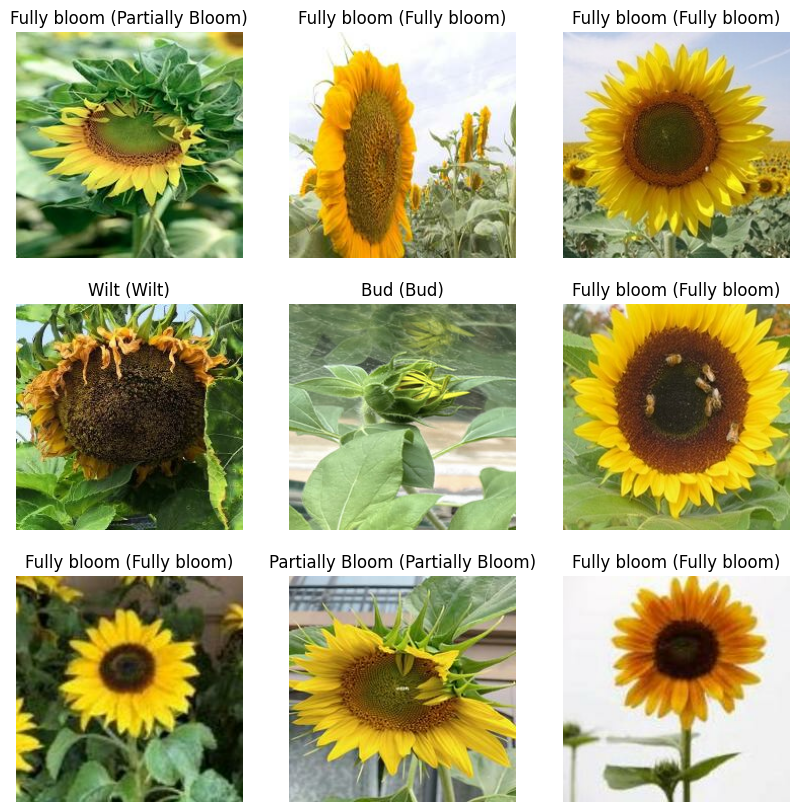

In [28]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adam_freeze_100.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [29]:
# Load base model (RMS Prop optimizer, freeze 100%)
base_model_RMSProp_freeze_100 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [30]:
# Freeze the base model
base_model_RMSProp_freeze_100.trainable = False

In [31]:
# Build the model (RMS Prop optimizer, freeze 100%, with data augmentation)
inputs_RMSProp_freeze_100 = tf.keras.Input(shape = (224, 224, 3))
x_RMSProp_freeze_100 = tf.keras.layers.RandomFlip('horizontal')(inputs_RMSProp_freeze_100)  # Randomly flip the image horizontally
x_RMSProp_freeze_100 = tf.keras.layers.RandomRotation(0.2)(x_RMSProp_freeze_100)   # Randomly rotate the image
x_RMSProp_freeze_100 = tf.keras.layers.RandomContrast(0.2)(x_RMSProp_freeze_100)   # Randomly adjust the contrast
x_RMSProp_freeze_100 = tf.keras.applications.inception_v3.preprocess_input(x_RMSProp_freeze_100)  # Data pre-processing layer of Inception V3
x_RMSProp_freeze_100 = base_model_RMSProp_freeze_100(x_RMSProp_freeze_100, training = False)   # Inception V3
x_RMSProp_freeze_100 = tf.keras.layers.Dropout(0.2)(x_RMSProp_freeze_100)   # Drop out layer (drop 20%)
x_RMSProp_freeze_100 = tf.keras.layers.Flatten()(x_RMSProp_freeze_100)
x_RMSProp_freeze_100 = tf.keras.layers.Dense(500, activation='relu')(x_RMSProp_freeze_100)
x_RMSProp_freeze_100 = tf.keras.layers.Dense(200, activation='relu')(x_RMSProp_freeze_100)
outputs_RMSProp_freeze_100 = tf.keras.layers.Dense(4, activation='softmax')(x_RMSProp_freeze_100)
model_RMSProp_freeze_100 = tf.keras.Model(inputs_RMSProp_freeze_100, outputs_RMSProp_freeze_100)

In [32]:
model_RMSProp_freeze_100.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 25,701,504 (98.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [33]:
# Compile model with RMS Prop optimizer (freeze 100%) with learning rate of 0.0001
model_RMSProp_freeze_100.compile(
    optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [34]:
# Train model (10 epochs)
histories_RMSProp_freeze_100 = model_RMSProp_freeze_100.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 136s 5s/step - accuracy: 0.4446 - loss: 4.4730 - val_accuracy: 0.8774 - val_loss: 0.3762
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 117s 5s/step - accuracy: 0.8282 - loss: 0.4997 - val_accuracy: 0.8323 - val_loss: 0.5034
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 126s 5s/step - accuracy: 0.8172 - loss: 0.5058 - val_accuracy: 0.9161 - val_loss: 0.2704
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 119s 5s/step - accuracy: 0.8936 - loss: 0.2873 - val_accuracy: 0.8452 - val_loss: 0.4833
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 121s 5s/step - accuracy: 0.8620 - loss: 0.3869 - val_accuracy: 0.8968 - val_loss: 0.3681
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 134s 6s/step - accuracy: 0.8901 - loss: 0.3255 - val_accuracy: 0.8968 - val_loss: 0.2258
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 133s 6s/step - accuracy: 0.9273 - loss: 0.2255 - val_accuracy: 0.9613 - val_loss: 0.1355
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 133s 6s/step - accuracy: 0.9480 - loss: 0.1761 - val_accuracy: 0.9161 - v

In [35]:
# Save the model
model_RMSProp_freeze_100.save('/tmp/inception_v3_RMSProp_freeze_100_epoch_10.keras')

In [36]:
histories_RMSProp_freeze_100.history

{'accuracy': [0.6005222201347351,
  0.8120104670524597,
  0.8355091214179993,
  0.8825065493583679,
  0.8864229917526245,
  0.9033942818641663,
  0.9190600514411926,
  0.9412532448768616,
  0.9242819547653198,
  0.9569190740585327],
 'loss': [2.5079269409179688,
  0.5794849991798401,
  0.4633116126060486,
  0.333683043718338,
  0.31368085741996765,
  0.2838290333747864,
  0.2357681840658188,
  0.17253296077251434,
  0.24713385105133057,
  0.11511621624231339],
 'val_accuracy': [0.8774193525314331,
  0.8322580456733704,
  0.9161290526390076,
  0.8451613187789917,
  0.896774172782898,
  0.896774172782898,
  0.9612902998924255,
  0.9161290526390076,
  0.9677419066429138,
  0.8774193525314331],
 'val_loss': [0.3761577010154724,
  0.503353476524353,
  0.27041125297546387,
  0.48325029015541077,
  0.36814457178115845,
  0.2257915437221527,
  0.13553114235401154,
  0.24547530710697174,
  0.12692144513130188,
  0.4968514144420624]}

In [38]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_RMSProp_freeze_100 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_RMSProp_freeze_100 = []

# Load to dictionary
for i in range(10):
    data_RMSProp_freeze_100.append({
        'Epoch': i + 1,
        'Training accuracy': histories_RMSProp_freeze_100.history['accuracy'][i],
        'Training loss': histories_RMSProp_freeze_100.history['loss'][i],
        'Validation accuracy': histories_RMSProp_freeze_100.history['val_accuracy'][i],
        'Validation loss': histories_RMSProp_freeze_100.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_RMSProp_freeze_100.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_RMSProp_freeze_100)
    writer.writeheader()
    writer.writerows(data_RMSProp_freeze_100)

In [39]:
# Test the model
loss_RMSProp_freeze_100, accuracy_RMSProp_freeze_100 = model_RMSProp_freeze_100.evaluate(test_dataset)
print('Test accuracy:', accuracy_RMSProp_freeze_100)
print('Test loss:', loss_RMSProp_freeze_100)

5/5 ━━━━━━━━━━━━━━━━━━━━ 17s 4s/step - accuracy: 0.8549 - loss: 0.4948
Test accuracy: 0.8653846383094788
Test loss: 0.487845778465271


In [40]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'RMS Prop, freeze 100%, with data augmentation','Test accuracy': accuracy_RMSProp_freeze_100, 'Test loss': loss_RMSProp_freeze_100})

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


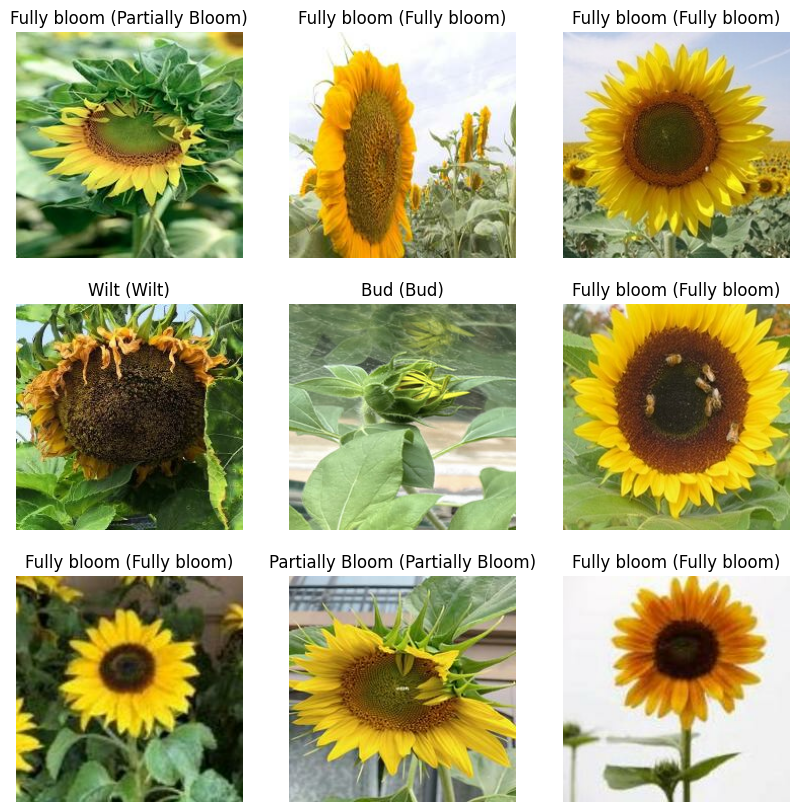

In [41]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_RMSProp_freeze_100.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [42]:
# Load base model (SGD optimizer, freeze 100%)
base_model_SGD_freeze_100 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [43]:
# Freeze the base model
base_model_SGD_freeze_100.trainable = False

In [44]:
# Build the model (SGD optimizer, freeze 100%, with data augmentation)
inputs_SGD_freeze_100 = tf.keras.Input(shape = (224, 224, 3))
x_SGD_freeze_100 = tf.keras.layers.RandomFlip('horizontal')(inputs_SGD_freeze_100)  # Randomly flip the image horizontally
x_SGD_freeze_100 = tf.keras.layers.RandomRotation(0.2)(x_SGD_freeze_100)   # Randomly rotate the image
x_SGD_freeze_100 = tf.keras.layers.RandomContrast(0.2)(x_SGD_freeze_100)   # Randomly adjust the contrast
x_SGD_freeze_100 = tf.keras.applications.inception_v3.preprocess_input(x_SGD_freeze_100)  # Data pre-processing layer of Inception V3
x_SGD_freeze_100 = base_model_SGD_freeze_100(x_SGD_freeze_100, training = False)   # Inception V3
x_SGD_freeze_100 = tf.keras.layers.Dropout(0.2)(x_SGD_freeze_100)   # Drop out layer (drop 20%)
x_SGD_freeze_100 = tf.keras.layers.Flatten()(x_SGD_freeze_100)
x_SGD_freeze_100 = tf.keras.layers.Dense(500, activation='relu')(x_SGD_freeze_100)
x_SGD_freeze_100 = tf.keras.layers.Dense(200, activation='relu')(x_SGD_freeze_100)
outputs_SGD_freeze_100 = tf.keras.layers.Dense(4, activation='softmax')(x_SGD_freeze_100)
model_SGD_freeze_100 = tf.keras.Model(inputs_SGD_freeze_100, outputs_SGD_freeze_100)

In [45]:
model_SGD_freeze_100.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 25,701,504 (98.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [46]:
# Compile model with SGD optimizer (freeze 100%) with learning rate of 0.0001
model_SGD_freeze_100.compile(
    optimizer = tf.keras.optimizers.SGD(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [47]:
# Train model (10 epochs)
histories_SGD_freeze_100 = model_SGD_freeze_100.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 147s 6s/step - accuracy: 0.3630 - loss: 1.4554 - val_accuracy: 0.5548 - val_loss: 1.0996
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 128s 5s/step - accuracy: 0.5331 - loss: 1.1361 - val_accuracy: 0.6774 - val_loss: 0.9317
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 126s 5s/step - accuracy: 0.6242 - loss: 0.9845 - val_accuracy: 0.7290 - val_loss: 0.8201
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 115s 5s/step - accuracy: 0.6376 - loss: 0.9167 - val_accuracy: 0.7742 - val_loss: 0.7348
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 116s 5s/step - accuracy: 0.6957 - loss: 0.8204 - val_accuracy: 0.8065 - val_loss: 0.6734
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 111s 5s/step - accuracy: 0.7208 - loss: 0.7433 - val_accuracy: 0.8194 - val_loss: 0.6265
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 114s 5s/step - accuracy: 0.7867 - loss: 0.6457 - val_accuracy: 0.8194 - val_loss: 0.5883
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 112s 5s/step - accuracy: 0.7562 - loss: 0.6631 - val_accuracy: 0.8258 - v

In [48]:
# Save the model
model_SGD_freeze_100.save('/tmp/inception_v3_SGD_freeze_100_epoch_10.keras')

In [49]:
histories_SGD_freeze_100.history

{'accuracy': [0.4255874752998352,
  0.562663197517395,
  0.622715413570404,
  0.6671018004417419,
  0.710182785987854,
  0.7349869608879089,
  0.7728459239006042,
  0.7650130391120911,
  0.7819843292236328,
  0.7911227345466614],
 'loss': [1.3553004264831543,
  1.0888559818267822,
  0.9763093590736389,
  0.8831391930580139,
  0.8000051379203796,
  0.7167147994041443,
  0.6732938885688782,
  0.6613976955413818,
  0.6169314980506897,
  0.61427903175354],
 'val_accuracy': [0.5548387169837952,
  0.6774193644523621,
  0.7290322780609131,
  0.774193525314331,
  0.8064516186714172,
  0.8193548321723938,
  0.8193548321723938,
  0.8258064389228821,
  0.8387096524238586,
  0.85161292552948],
 'val_loss': [1.0996429920196533,
  0.9316983222961426,
  0.8201239705085754,
  0.7347939014434814,
  0.6734247207641602,
  0.6265321373939514,
  0.5883446335792542,
  0.5621497631072998,
  0.5327199101448059,
  0.5097910165786743]}

In [50]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_SGD_freeze_100 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_SGD_freeze_100 = []

# Load to dictionary
for i in range(10):
    data_SGD_freeze_100.append({
        'Epoch': i + 1,
        'Training accuracy': histories_SGD_freeze_100.history['accuracy'][i],
        'Training loss': histories_SGD_freeze_100.history['loss'][i],
        'Validation accuracy': histories_SGD_freeze_100.history['val_accuracy'][i],
        'Validation loss': histories_SGD_freeze_100.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_SGD_freeze_100.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_SGD_freeze_100)
    writer.writeheader()
    writer.writerows(data_SGD_freeze_100)

In [51]:
# Test the model
loss_SGD_freeze_100, accuracy_SGD_freeze_100 = model_SGD_freeze_100.evaluate(test_dataset)
print('Test accuracy:', accuracy_SGD_freeze_100)
print('Test loss:', loss_SGD_freeze_100)

5/5 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step - accuracy: 0.8588 - loss: 0.4732
Test accuracy: 0.8525640964508057
Test loss: 0.5001843571662903


In [52]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'SGD, freeze 100%, with data augmentation','Test accuracy': accuracy_SGD_freeze_100, 'Test loss': loss_SGD_freeze_100})

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


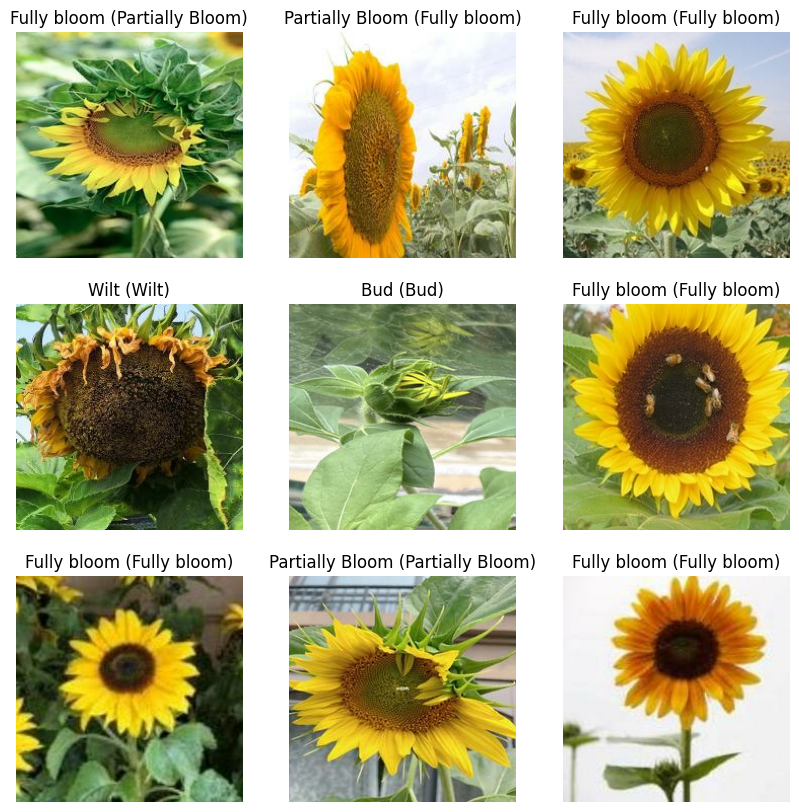

In [53]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_SGD_freeze_100.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [10]:
# Load base model (Adagrad optimizer, freeze 100%)
base_model_Adagrad_freeze_100 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [11]:
# Freeze the base model
base_model_Adagrad_freeze_100.trainable = False

In [12]:
# Build the model (Adagrad optimizer, freeze 100%, with data augmentation)
inputs_Adagrad_freeze_100 = tf.keras.Input(shape = (224, 224, 3))
x_Adagrad_freeze_100 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adagrad_freeze_100)  # Randomly flip the image horizontally
x_Adagrad_freeze_100 = tf.keras.layers.RandomRotation(0.2)(x_Adagrad_freeze_100)   # Randomly rotate the image
x_Adagrad_freeze_100 = tf.keras.layers.RandomContrast(0.2)(x_Adagrad_freeze_100)   # Randomly adjust the contrast
x_Adagrad_freeze_100 = tf.keras.applications.inception_v3.preprocess_input(x_Adagrad_freeze_100)  # Data pre-processing layer of Inception V3
x_Adagrad_freeze_100 = base_model_Adagrad_freeze_100(x_Adagrad_freeze_100, training = False)   # Inception V3
x_Adagrad_freeze_100 = tf.keras.layers.Dropout(0.2)(x_Adagrad_freeze_100)   # Drop out layer (drop 20%)
x_Adagrad_freeze_100 = tf.keras.layers.Flatten()(x_Adagrad_freeze_100)
x_Adagrad_freeze_100 = tf.keras.layers.Dense(500, activation='relu')(x_Adagrad_freeze_100)
x_Adagrad_freeze_100 = tf.keras.layers.Dense(200, activation='relu')(x_Adagrad_freeze_100)
outputs_Adagrad_freeze_100 = tf.keras.layers.Dense(4, activation='softmax')(x_Adagrad_freeze_100)
model_Adagrad_freeze_100 = tf.keras.Model(inputs_Adagrad_freeze_100, outputs_Adagrad_freeze_100)

In [13]:
model_Adagrad_freeze_100.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 25,701,504 (98.04 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [14]:
# Compile model with Adagrad optimizer (freeze 100%) with learning rate of 0.0001
model_Adagrad_freeze_100.compile(
    optimizer = tf.keras.optimizers.Adagrad(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [16]:
# Train model (10 epochs)
histories_Adagrad_freeze_100 = model_Adagrad_freeze_100.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 144s 5s/step - accuracy: 0.3925 - loss: 1.5101 - val_accuracy: 0.6968 - val_loss: 0.7932
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 130s 5s/step - accuracy: 0.6590 - loss: 0.8712 - val_accuracy: 0.8000 - val_loss: 0.6029
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 144s 5s/step - accuracy: 0.7944 - loss: 0.6100 - val_accuracy: 0.8258 - val_loss: 0.5165
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.8026 - loss: 0.5329 - val_accuracy: 0.8581 - val_loss: 0.4586
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 122s 5s/step - accuracy: 0.8058 - loss: 0.5122 - val_accuracy: 0.8581 - val_loss: 0.4385
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 123s 5s/step - accuracy: 0.8752 - loss: 0.4010 - val_accuracy: 0.8710 - val_loss: 0.4073
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 120s 5s/step - accuracy: 0.8856 - loss: 0.3470 - val_accuracy: 0.8903 - val_loss: 0.3697
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 123s 5s/step - accuracy: 0.8749 - loss: 0.3937 - val_accuracy: 0.8903 - v

In [17]:
# Save the model
model_Adagrad_freeze_100.save('/tmp/inception_v3_Adagrad_freeze_100_epoch_10.keras')

In [18]:
histories_Adagrad_freeze_100.history

{'accuracy': [0.5039164423942566,
  0.6997389197349548,
  0.7806788682937622,
  0.8080939650535583,
  0.8211488127708435,
  0.8394255638122559,
  0.8616188168525696,
  0.8655352592468262,
  0.8825065493583679,
  0.8838120102882385],
 'loss': [1.2150636911392212,
  0.793812096118927,
  0.6261277794837952,
  0.5276117920875549,
  0.4799022674560547,
  0.460552841424942,
  0.3975294530391693,
  0.3996415436267853,
  0.37204301357269287,
  0.3319947421550751],
 'val_accuracy': [0.6967741847038269,
  0.800000011920929,
  0.8258064389228821,
  0.8580645322799683,
  0.8580645322799683,
  0.8709677457809448,
  0.8903225660324097,
  0.8903225660324097,
  0.9032257795333862,
  0.8838709592819214],
 'val_loss': [0.7932183742523193,
  0.6029438972473145,
  0.5165462493896484,
  0.45857176184654236,
  0.43847423791885376,
  0.40734371542930603,
  0.36970990896224976,
  0.36113330721855164,
  0.3437056839466095,
  0.34748247265815735]}

In [19]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adagrad_freeze_100 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adagrad_freeze_100 = []

# Load to dictionary
for i in range(10):
    data_Adagrad_freeze_100.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adagrad_freeze_100.history['accuracy'][i],
        'Training loss': histories_Adagrad_freeze_100.history['loss'][i],
        'Validation accuracy': histories_Adagrad_freeze_100.history['val_accuracy'][i],
        'Validation loss': histories_Adagrad_freeze_100.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adagrad_freeze_100.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adagrad_freeze_100)
    writer.writeheader()
    writer.writerows(data_Adagrad_freeze_100)

In [20]:
# Test the model
loss_Adagrad_freeze_100, accuracy_Adagrad_freeze_100 = model_Adagrad_freeze_100.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adagrad_freeze_100)
print('Test loss:', loss_Adagrad_freeze_100)

5/5 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step - accuracy: 0.8946 - loss: 0.3284
Test accuracy: 0.9038461446762085
Test loss: 0.3160366415977478


In [22]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'Adagrad, freeze 100%, with data augmentation','Test accuracy': accuracy_Adagrad_freeze_100, 'Test loss': loss_Adagrad_freeze_100})

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


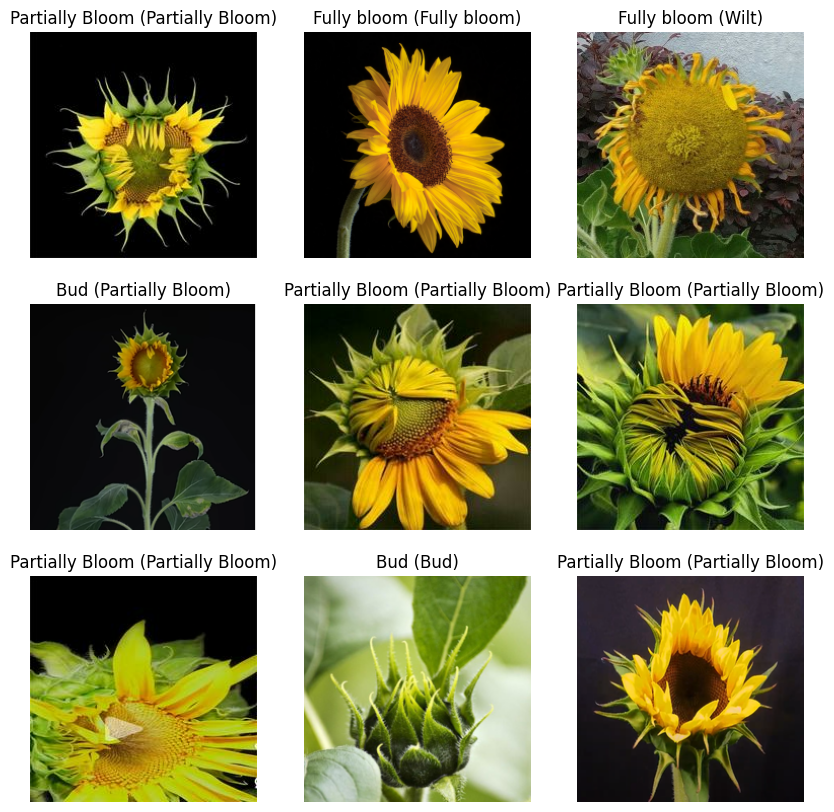

In [23]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adagrad_freeze_100.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [24]:
# Get data of test accuracies of Adam, RMS Prop, SGD and Adagrad optimizers
test_accuracies = []
with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == 'Adam, freeze 100%, with data augmentation' or row[0] == 'RMS Prop, freeze 100%, with data augmentation' or row[0] == 'SGD, freeze 100%, with data augmentation' or row [0] == 'Adagrad, freeze 100%, with data augmentation':
            test_accuracies.append(float(row[1]) * 100)

In [25]:
test_accuracies

[91.66666865348816, 86.53846383094788, 85.25640964508057, 90.38461446762085]

In [29]:
# Get data of validation accuracies of Adam, RMS Prop, SGD, Adagrad and Adadelta optimizers
validation_accuracies = []

# Adam
with open('/tmp/histories_inception_V3_Adam_freeze_100.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# RMS Prop
with open('/tmp/histories_inception_V3_RMSProp_freeze_100.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# SGD
with open('/tmp/histories_inception_V3_SGD_freeze_100.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# Adagrad
with open('/tmp/histories_inception_V3_Adagrad_freeze_100.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

In [30]:
validation_accuracies

[91.61290526390076, 87.74193525314331, 85.161292552948, 88.38709592819214]

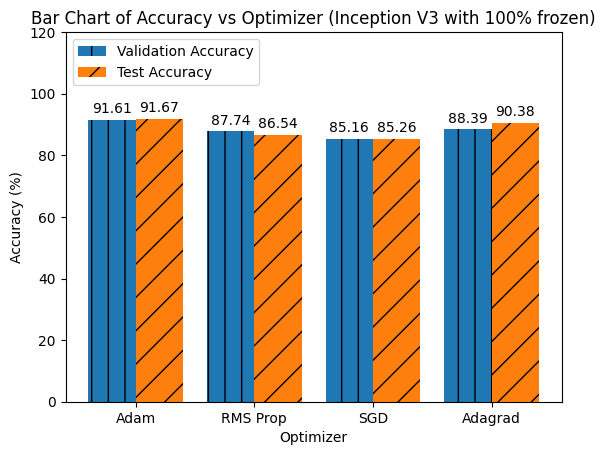

In [99]:
# Draw bar graph of validation and training accuracy vs optimizer
# Reference 1: https://matplotlib.org/stable/gallery/lines_bars_and_markers/barchart.html
# Reference 2: https://python-graph-gallery.com/6-change-bars-texture/

optimizers = ['Adam', 'RMS Prop', 'SGD', 'Adagrad']
accuracies = {
    'Validation Accuracy': validation_accuracies,
    'Test Accuracy': test_accuracies
}

x = np.arange(4)   # 4 items in x-axis
width = 0.4  # width of bars
multiplier = 0  # multiplier for offset (position of bar)

fig, ax = plt.subplots()

for attribute, accuracy in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, accuracy, width, label=attribute)  # draw bar
    ax.bar_label(rects, padding=3, fmt='%.2f')  # label on top of bar
    if attribute == 'Validation Accuracy':
        for rect in rects:
            rect.set_hatch('|')   # add texture
    else:
        for rect in rects:
            rect.set_hatch('/')   # add texture
    multiplier += 1

ax.set_ylabel('Accuracy (%)')
ax.set_xlabel('Optimizer')
ax.set_title('Bar Chart of Accuracy vs Optimizer (Inception V3 with 100% frozen)')
ax.set_xticks(x + (width/2), optimizers)
ax.legend(loc='upper left')
ax.set_ylim(0, 120)

plt.show()

In [32]:
# Load base model (Adam optimizer, unfreeze 10%)
base_model_Adam_unfreeze_10 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [33]:
# Freeze the base model
base_model_Adam_unfreeze_10.trainable = False

In [34]:
print('Number of layers in the base model:', len(base_model_Adam_unfreeze_10.layers))

Number of layers in the base model: 311


In [35]:
# Unfreeze layer 281 to layer 311 (index 280 to 310)
for layer in base_model_Adam_unfreeze_10.layers[280:311]:
  layer.trainable = True

In [36]:
# Check number of unfreezed layers (should be 31 (about 10%))
numberofTrainablelayers = 0
for layer in base_model_Adam_unfreeze_10.layers:
  if layer.trainable:
    numberofTrainablelayers += 1
print('Number of unfreezed layers:', numberofTrainablelayers)

Number of unfreezed layers: 31


In [37]:
# Build the model (Adam optimizer, unfreeze 10%, with data augmentation)
inputs_Adam_unfreeze_10 = tf.keras.Input(shape = (224, 224, 3))
x_Adam_unfreeze_10 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adam_unfreeze_10)  # Randomly flip the image horizontally
x_Adam_unfreeze_10 = tf.keras.layers.RandomRotation(0.2)(x_Adam_unfreeze_10)   # Randomly rotate the image
x_Adam_unfreeze_10 = tf.keras.layers.RandomContrast(0.2)(x_Adam_unfreeze_10)   # Randomly adjust the contrast
x_Adam_unfreeze_10 = tf.keras.applications.inception_v3.preprocess_input(x_Adam_unfreeze_10)  # Data pre-processing layer of Inception V3
x_Adam_unfreeze_10 = base_model_Adam_unfreeze_10(x_Adam_unfreeze_10, training = False)   # Inception V3
x_Adam_unfreeze_10 = tf.keras.layers.Dropout(0.2)(x_Adam_unfreeze_10)   # Drop out layer (drop 20%)
x_Adam_unfreeze_10 = tf.keras.layers.Flatten()(x_Adam_unfreeze_10)
x_Adam_unfreeze_10 = tf.keras.layers.Dense(500, activation='relu')(x_Adam_unfreeze_10)
x_Adam_unfreeze_10 = tf.keras.layers.Dense(200, activation='relu')(x_Adam_unfreeze_10)
outputs_Adam_unfreeze_10 = tf.keras.layers.Dense(4, activation='softmax')(x_Adam_unfreeze_10)
model_Adam_unfreeze_10 = tf.keras.Model(inputs_Adam_unfreeze_10, outputs_Adam_unfreeze_10)

In [38]:
model_Adam_unfreeze_10.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 31,775,040 (121.21 MB)

 Non-trainable params: 15,729,248 (60.00 MB)

In [39]:
# Compile model with Adam optimizer (unfreeze 10%) with learning rate of 0.0001
model_Adam_unfreeze_10.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [41]:
# Train model (10 epochs)
histories_Adam_unfreeze_10 = model_Adam_unfreeze_10.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 204s 9s/step - accuracy: 0.7086 - loss: 0.8463 - val_accuracy: 0.9355 - val_loss: 0.2037
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 231s 7s/step - accuracy: 0.9015 - loss: 0.2432 - val_accuracy: 0.9355 - val_loss: 0.2440
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 219s 8s/step - accuracy: 0.9609 - loss: 0.1315 - val_accuracy: 0.9613 - val_loss: 0.1707
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 174s 7s/step - accuracy: 0.9621 - loss: 0.1091 - val_accuracy: 0.9419 - val_loss: 0.2076
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 245s 9s/step - accuracy: 0.9716 - loss: 0.0784 - val_accuracy: 0.9355 - val_loss: 0.1529
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 182s 8s/step - accuracy: 0.9821 - loss: 0.0536 - val_accuracy: 0.8968 - val_loss: 0.3407
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 239s 9s/step - accuracy: 0.9830 - loss: 0.0553 - val_accuracy: 0.9355 - val_loss: 0.1298
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 165s 7s/step - accuracy: 0.9877 - loss: 0.0333 - val_accuracy: 0.9613 - v

In [42]:
# Save the model
model_Adam_unfreeze_10.save('/tmp/inception_v3_Adam_unfreeze_10_epoch_10.keras')

In [43]:
histories_Adam_unfreeze_10.history

{'accuracy': [0.7832897901535034,
  0.9007833003997803,
  0.9621409773826599,
  0.9582245349884033,
  0.9738903641700745,
  0.9817232489585876,
  0.9830287098884583,
  0.9856396913528442,
  0.9856396913528442,
  0.9869451522827148],
 'loss': [0.616348922252655,
  0.25665929913520813,
  0.12796063721179962,
  0.11049938946962357,
  0.08359478414058685,
  0.053931109607219696,
  0.05136890709400177,
  0.034871652722358704,
  0.04309077560901642,
  0.03574232757091522],
 'val_accuracy': [0.9354838728904724,
  0.9354838728904724,
  0.9612902998924255,
  0.9419354796409607,
  0.9354838728904724,
  0.896774172782898,
  0.9354838728904724,
  0.9612902998924255,
  0.9354838728904724,
  0.9419354796409607],
 'val_loss': [0.20367901027202606,
  0.24402645230293274,
  0.17069663107395172,
  0.207567498087883,
  0.15294763445854187,
  0.34065181016921997,
  0.12977561354637146,
  0.13865064084529877,
  0.23676149547100067,
  0.2779742479324341]}

In [44]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adam_unfreeze_10 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adam_unfreeze_10 = []

# Load to dictionary
for i in range(10):
    data_Adam_unfreeze_10.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adam_unfreeze_10.history['accuracy'][i],
        'Training loss': histories_Adam_unfreeze_10.history['loss'][i],
        'Validation accuracy': histories_Adam_unfreeze_10.history['val_accuracy'][i],
        'Validation loss': histories_Adam_unfreeze_10.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adam_unfreeze_10_epoch_10.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adam_unfreeze_10)
    writer.writeheader()
    writer.writerows(data_Adam_unfreeze_10)

In [45]:
# Test the model
loss_Adam_unfreeze_10, accuracy_Adam_unfreeze_10 = model_Adam_unfreeze_10.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adam_unfreeze_10)
print('Test loss:', loss_Adam_unfreeze_10)

5/5 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - accuracy: 0.9741 - loss: 0.1983
Test accuracy: 0.9679487347602844
Test loss: 0.23099663853645325


In [58]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'Adam, unfreeze 10%, with data augmentation','Test accuracy': accuracy_Adam_unfreeze_10, 'Test loss': loss_Adam_unfreeze_10})

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


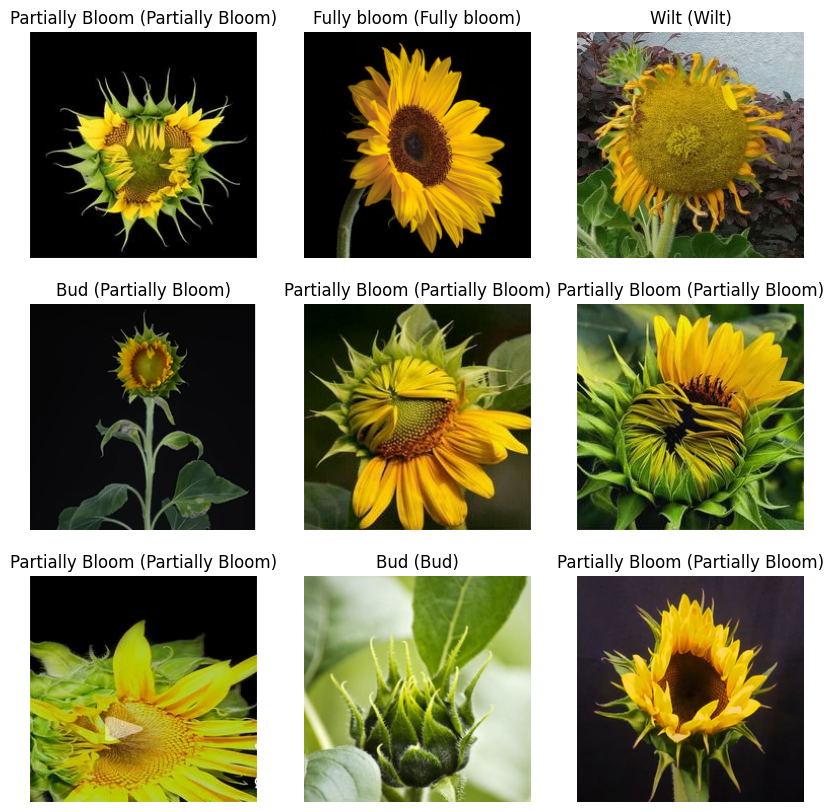

In [47]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adam_unfreeze_10.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [48]:
# Load base model (Adam optimizer, unfreeze 15%)
base_model_Adam_unfreeze_15 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [49]:
# Freeze the base model
base_model_Adam_unfreeze_15.trainable = False

In [50]:
print('Number of layers in the base model:', len(base_model_Adam_unfreeze_15.layers))

Number of layers in the base model: 311


In [51]:
# Unfreeze layer 265 to layer 311 (index 264 to 310)
for layer in base_model_Adam_unfreeze_15.layers[264:311]:
  layer.trainable = True

In [52]:
# Check number of unfreezed layers (should be 47 (about 15%))
numberofTrainablelayers = 0
for layer in base_model_Adam_unfreeze_15.layers:
  if layer.trainable:
    numberofTrainablelayers += 1
print('Number of unfreezed layers:', numberofTrainablelayers)

Number of unfreezed layers: 47


In [53]:
# Build the model (Adam optimizer, unfreeze 15%, with data augmentation)
inputs_Adam_unfreeze_15 = tf.keras.Input(shape = (224, 224, 3))
x_Adam_unfreeze_15 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adam_unfreeze_15)  # Randomly flip the image horizontally
x_Adam_unfreeze_15 = tf.keras.layers.RandomRotation(0.2)(x_Adam_unfreeze_15)   # Randomly rotate the image
x_Adam_unfreeze_15 = tf.keras.layers.RandomContrast(0.2)(x_Adam_unfreeze_15)   # Randomly adjust the contrast
x_Adam_unfreeze_15 = tf.keras.applications.inception_v3.preprocess_input(x_Adam_unfreeze_15)  # Data pre-processing layer of Inception V3
x_Adam_unfreeze_15 = base_model_Adam_unfreeze_15(x_Adam_unfreeze_15, training = False)   # Inception V3
x_Adam_unfreeze_15 = tf.keras.layers.Dropout(0.2)(x_Adam_unfreeze_15)   # Drop out layer (drop 20%)
x_Adam_unfreeze_15 = tf.keras.layers.Flatten()(x_Adam_unfreeze_15)
x_Adam_unfreeze_15 = tf.keras.layers.Dense(500, activation='relu')(x_Adam_unfreeze_15)
x_Adam_unfreeze_15 = tf.keras.layers.Dense(200, activation='relu')(x_Adam_unfreeze_15)
outputs_Adam_unfreeze_15 = tf.keras.layers.Dense(4, activation='softmax')(x_Adam_unfreeze_15)
model_Adam_unfreeze_15 = tf.keras.Model(inputs_Adam_unfreeze_15, outputs_Adam_unfreeze_15)

In [54]:
model_Adam_unfreeze_15.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 32,022,848 (122.16 MB)

 Non-trainable params: 15,481,440 (59.06 MB)

In [55]:
# Compile model with Adam optimizer (unfreeze 15%) with learning rate of 0.0001
model_Adam_unfreeze_15.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [59]:
# Train model (10 epochs)
histories_Adam_unfreeze_15 = model_Adam_unfreeze_15.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 148s 6s/step - accuracy: 0.7242 - loss: 0.7140 - val_accuracy: 0.8839 - val_loss: 0.3766
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 145s 6s/step - accuracy: 0.8766 - loss: 0.3284 - val_accuracy: 0.9161 - val_loss: 0.2876
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 203s 6s/step - accuracy: 0.9427 - loss: 0.1744 - val_accuracy: 0.9484 - val_loss: 0.1973
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 147s 6s/step - accuracy: 0.9770 - loss: 0.0765 - val_accuracy: 0.9419 - val_loss: 0.2290
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 147s 6s/step - accuracy: 0.9746 - loss: 0.0797 - val_accuracy: 0.9355 - val_loss: 0.2148
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 145s 6s/step - accuracy: 0.9793 - loss: 0.0673 - val_accuracy: 0.9097 - val_loss: 0.3632
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 145s 6s/step - accuracy: 0.9814 - loss: 0.0532 - val_accuracy: 0.9161 - val_loss: 0.2380
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 201s 6s/step - accuracy: 0.9776 - loss: 0.0586 - val_accuracy: 0.9484 - v

In [60]:
# Save the model
model_Adam_unfreeze_15.save('/tmp/inception_v3_Adam_unfreeze_15_epoch_10.keras')

In [61]:
histories_Adam_unfreeze_15.history

{'accuracy': [0.7872062921524048,
  0.8994777798652649,
  0.9530026316642761,
  0.9673629403114319,
  0.9804177284240723,
  0.9830287098884583,
  0.9895561337471008,
  0.9804177284240723,
  0.9882506728172302,
  0.9869451522827148],
 'loss': [0.5755631327629089,
  0.3032071590423584,
  0.15294145047664642,
  0.09744885563850403,
  0.0661880299448967,
  0.0476531945168972,
  0.034199781715869904,
  0.058366142213344574,
  0.03719855844974518,
  0.02919594943523407],
 'val_accuracy': [0.8838709592819214,
  0.9161290526390076,
  0.948387086391449,
  0.9419354796409607,
  0.9354838728904724,
  0.9096774458885193,
  0.9161290526390076,
  0.948387086391449,
  0.9354838728904724,
  0.9354838728904724],
 'val_loss': [0.3766074776649475,
  0.28757378458976746,
  0.19726546108722687,
  0.22897969186306,
  0.21482403576374054,
  0.3632200062274933,
  0.23795370757579803,
  0.17259439826011658,
  0.15768705308437347,
  0.15342214703559875]}

In [62]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adam_unfreeze_15 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adam_unfreeze_15 = []

# Load to dictionary
for i in range(10):
    data_Adam_unfreeze_15.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adam_unfreeze_15.history['accuracy'][i],
        'Training loss': histories_Adam_unfreeze_15.history['loss'][i],
        'Validation accuracy': histories_Adam_unfreeze_15.history['val_accuracy'][i],
        'Validation loss': histories_Adam_unfreeze_15.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adam_unfreeze_15_epoch_10.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adam_unfreeze_15)
    writer.writeheader()
    writer.writerows(data_Adam_unfreeze_15)

In [63]:
# Test the model
loss_Adam_unfreeze_15, accuracy_Adam_unfreeze_15 = model_Adam_unfreeze_15.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adam_unfreeze_15)
print('Test loss:', loss_Adam_unfreeze_15)

5/5 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - accuracy: 0.9447 - loss: 0.1960
Test accuracy: 0.942307710647583
Test loss: 0.2082742601633072


In [65]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'Adam, unfreeze 15%, with data augmentation','Test accuracy': accuracy_Adam_unfreeze_15, 'Test loss': loss_Adam_unfreeze_15})

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


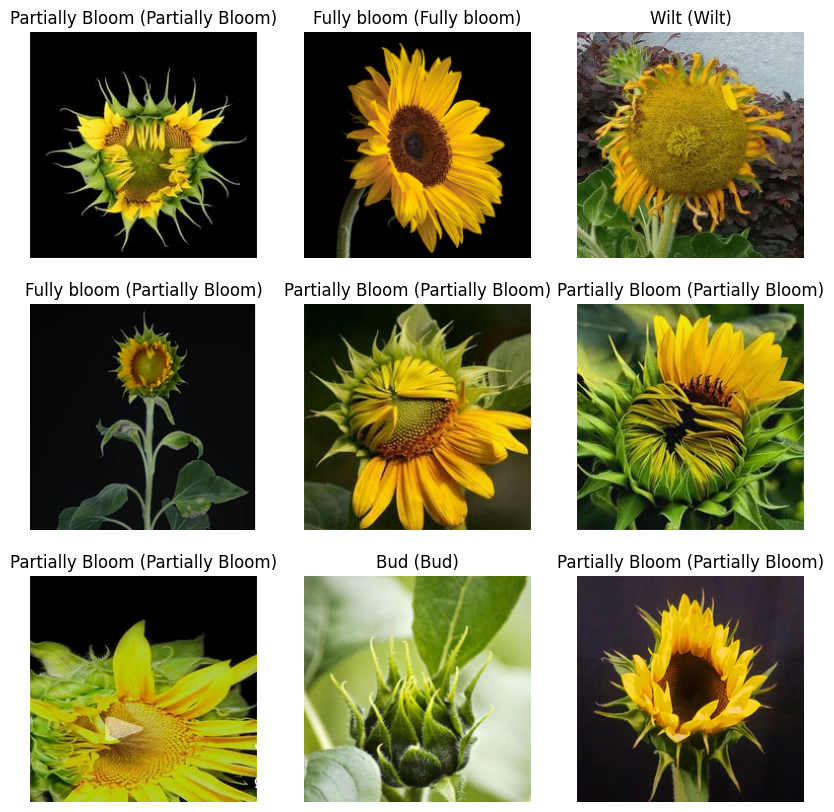

In [66]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adam_unfreeze_15.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [67]:
# Load base model (Adam optimizer, unfreeze 20%)
base_model_Adam_unfreeze_20 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [68]:
# Freeze the base model
base_model_Adam_unfreeze_20.trainable = False

In [69]:
print('Number of layers in the base model:', len(base_model_Adam_unfreeze_20.layers))

Number of layers in the base model: 311


In [70]:
# Unfreeze layer 250 to layer 311 (index 249 to 310)
for layer in base_model_Adam_unfreeze_20.layers[249:311]:
  layer.trainable = True

In [71]:
# Check number of unfreezed layers (should be 62 (about 20%))
numberofTrainablelayers = 0
for layer in base_model_Adam_unfreeze_20.layers:
  if layer.trainable:
    numberofTrainablelayers += 1
print('Number of unfreezed layers:', numberofTrainablelayers)

Number of unfreezed layers: 62


In [72]:
# Build the model (Adam optimizer, unfreeze 20%, with data augmentation)
inputs_Adam_unfreeze_20 = tf.keras.Input(shape = (224, 224, 3))
x_Adam_unfreeze_20 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adam_unfreeze_20)  # Randomly flip the image horizontally
x_Adam_unfreeze_20 = tf.keras.layers.RandomRotation(0.2)(x_Adam_unfreeze_20)   # Randomly rotate the image
x_Adam_unfreeze_20 = tf.keras.layers.RandomContrast(0.2)(x_Adam_unfreeze_20)   # Randomly adjust the contrast
x_Adam_unfreeze_20 = tf.keras.applications.inception_v3.preprocess_input(x_Adam_unfreeze_20)  # Data pre-processing layer of Inception V3
x_Adam_unfreeze_20 = base_model_Adam_unfreeze_20(x_Adam_unfreeze_20, training = False)   # Inception V3
x_Adam_unfreeze_20 = tf.keras.layers.Dropout(0.2)(x_Adam_unfreeze_20)   # Drop out layer (drop 20%)
x_Adam_unfreeze_20 = tf.keras.layers.Flatten()(x_Adam_unfreeze_20)
x_Adam_unfreeze_20 = tf.keras.layers.Dense(500, activation='relu')(x_Adam_unfreeze_20)
x_Adam_unfreeze_20 = tf.keras.layers.Dense(200, activation='relu')(x_Adam_unfreeze_20)
outputs_Adam_unfreeze_20 = tf.keras.layers.Dense(4, activation='softmax')(x_Adam_unfreeze_20)
model_Adam_unfreeze_20 = tf.keras.Model(inputs_Adam_unfreeze_20, outputs_Adam_unfreeze_20)

In [73]:
model_Adam_unfreeze_20.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_3 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_3               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_3               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_3 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_3 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 36,816,384 (140.44 MB)

 Non-trainable params: 10,687,904 (40.77 MB)

In [74]:
# Compile model with Adam optimizer (unfreeze 20%) with learning rate of 0.0001
model_Adam_unfreeze_20.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [75]:
# Train model (10 epochs)
histories_Adam_unfreeze_20 = model_Adam_unfreeze_20.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 204s 7s/step - accuracy: 0.4915 - loss: 1.5147 - val_accuracy: 0.8065 - val_loss: 0.6122
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 157s 7s/step - accuracy: 0.9269 - loss: 0.2234 - val_accuracy: 0.9032 - val_loss: 0.3815
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 157s 7s/step - accuracy: 0.9670 - loss: 0.1256 - val_accuracy: 0.9290 - val_loss: 0.2744
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 156s 7s/step - accuracy: 0.9650 - loss: 0.0916 - val_accuracy: 0.9548 - val_loss: 0.1740
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 158s 7s/step - accuracy: 0.9864 - loss: 0.0481 - val_accuracy: 0.9097 - val_loss: 0.3523
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 154s 6s/step - accuracy: 0.9865 - loss: 0.0460 - val_accuracy: 0.9419 - val_loss: 0.2482
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 159s 7s/step - accuracy: 0.9868 - loss: 0.0297 - val_accuracy: 0.9419 - val_loss: 0.2988
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 160s 7s/step - accuracy: 0.9918 - loss: 0.0253 - val_accuracy: 0.9290 - v

In [76]:
# Save the model
model_Adam_unfreeze_20.save('/tmp/inception_v3_Adam_unfreeze_20_epoch_10.keras')

In [77]:
histories_Adam_unfreeze_20.history

{'accuracy': [0.6697127819061279,
  0.9164490699768066,
  0.9516971111297607,
  0.9673629403114319,
  0.9843342304229736,
  0.9882506728172302,
  0.9882506728172302,
  0.9895561337471008,
  0.9895561337471008,
  0.9895561337471008],
 'loss': [0.9508459568023682,
  0.2405657023191452,
  0.15611223876476288,
  0.09522303938865662,
  0.05077194795012474,
  0.03788089379668236,
  0.0289511326700449,
  0.025900309905409813,
  0.02223093807697296,
  0.030575411394238472],
 'val_accuracy': [0.8064516186714172,
  0.9032257795333862,
  0.9290322661399841,
  0.9548386931419373,
  0.9096774458885193,
  0.9419354796409607,
  0.9419354796409607,
  0.9290322661399841,
  0.948387086391449,
  0.948387086391449],
 'val_loss': [0.6122035384178162,
  0.38147586584091187,
  0.27436596155166626,
  0.17402580380439758,
  0.3523394465446472,
  0.24824415147304535,
  0.29878950119018555,
  0.2598190903663635,
  0.2385818511247635,
  0.3083132803440094]}

In [78]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adam_unfreeze_20 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adam_unfreeze_20 = []

# Load to dictionary
for i in range(10):
    data_Adam_unfreeze_20.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adam_unfreeze_20.history['accuracy'][i],
        'Training loss': histories_Adam_unfreeze_20.history['loss'][i],
        'Validation accuracy': histories_Adam_unfreeze_20.history['val_accuracy'][i],
        'Validation loss': histories_Adam_unfreeze_20.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adam_unfreeze_20_epoch_10.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adam_unfreeze_20)
    writer.writeheader()
    writer.writerows(data_Adam_unfreeze_20)

In [79]:
# Test the model
loss_Adam_unfreeze_20, accuracy_Adam_unfreeze_20 = model_Adam_unfreeze_20.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adam_unfreeze_20)
print('Test loss:', loss_Adam_unfreeze_20)

5/5 ━━━━━━━━━━━━━━━━━━━━ 21s 4s/step - accuracy: 0.9534 - loss: 0.2922
Test accuracy: 0.9551281929016113
Test loss: 0.2827394902706146


In [80]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'Adam, unfreeze 20%, with data augmentation','Test accuracy': accuracy_Adam_unfreeze_20, 'Test loss': loss_Adam_unfreeze_20})

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


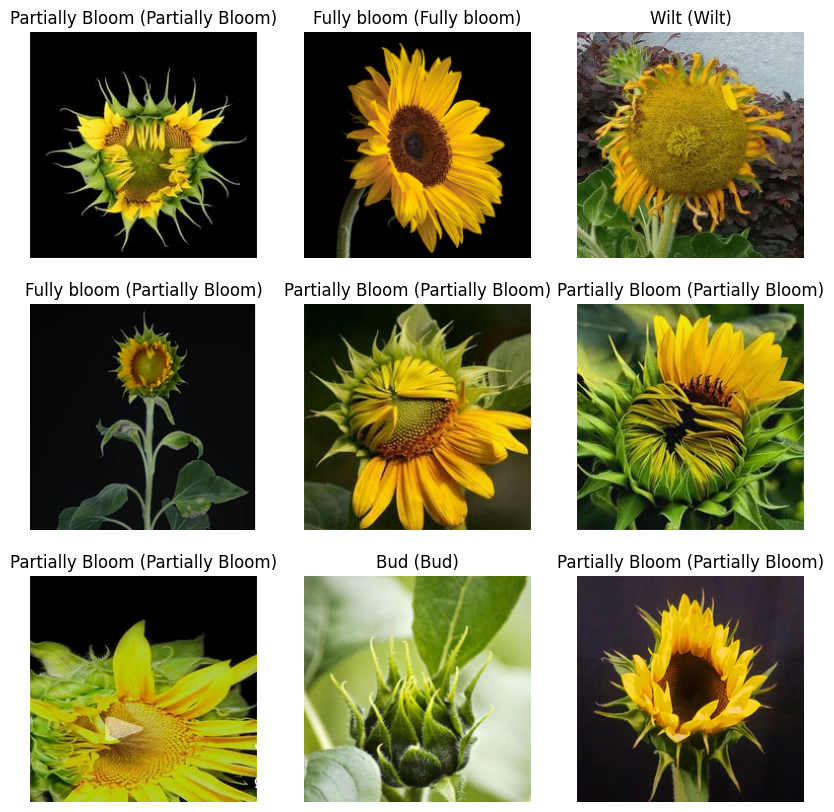

In [81]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adam_unfreeze_20.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [82]:
# Load base model (Adam optimizer, unfreeze 25%)
base_model_Adam_unfreeze_25 = tf.keras.applications.InceptionV3(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet'
)

In [83]:
# Freeze the base model
base_model_Adam_unfreeze_25.trainable = False

In [84]:
print('Number of layers in the base model:', len(base_model_Adam_unfreeze_25.layers))

Number of layers in the base model: 311


In [85]:
# Unfreeze layer 234 to layer 311 (index 233 to 310)
for layer in base_model_Adam_unfreeze_25.layers[233:311]:
  layer.trainable = True

In [86]:
# Check number of unfreezed layers (should be 78 (about 25%))
numberofTrainablelayers = 0
for layer in base_model_Adam_unfreeze_25.layers:
  if layer.trainable:
    numberofTrainablelayers += 1
print('Number of unfreezed layers:', numberofTrainablelayers)

Number of unfreezed layers: 78


In [87]:
# Build the model (Adam optimizer, unfreeze 25%, with data augmentation)
inputs_Adam_unfreeze_25 = tf.keras.Input(shape = (224, 224, 3))
x_Adam_unfreeze_25 = tf.keras.layers.RandomFlip('horizontal')(inputs_Adam_unfreeze_25)  # Randomly flip the image horizontally
x_Adam_unfreeze_25 = tf.keras.layers.RandomRotation(0.2)(x_Adam_unfreeze_25)   # Randomly rotate the image
x_Adam_unfreeze_25 = tf.keras.layers.RandomContrast(0.2)(x_Adam_unfreeze_25)   # Randomly adjust the contrast
x_Adam_unfreeze_25 = tf.keras.applications.inception_v3.preprocess_input(x_Adam_unfreeze_25)  # Data pre-processing layer of Inception V3
x_Adam_unfreeze_25 = base_model_Adam_unfreeze_25(x_Adam_unfreeze_25, training = False)   # Inception V3
x_Adam_unfreeze_25 = tf.keras.layers.Dropout(0.2)(x_Adam_unfreeze_25)   # Drop out layer (drop 20%)
x_Adam_unfreeze_25 = tf.keras.layers.Flatten()(x_Adam_unfreeze_25)
x_Adam_unfreeze_25 = tf.keras.layers.Dense(500, activation='relu')(x_Adam_unfreeze_25)
x_Adam_unfreeze_25 = tf.keras.layers.Dense(200, activation='relu')(x_Adam_unfreeze_25)
outputs_Adam_unfreeze_25 = tf.keras.layers.Dense(4, activation='softmax')(x_Adam_unfreeze_25)
model_Adam_unfreeze_25 = tf.keras.Model(inputs_Adam_unfreeze_25, outputs_Adam_unfreeze_25)

In [88]:
model_Adam_unfreeze_25.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_4 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_4               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_4               │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_4 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_4 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 5, 5, 2048)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 500)            │    25,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 200)            │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 4)              │           804 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,504,288 (181.21 MB)

 Trainable params: 38,107,712 (145.37 MB)

 Non-trainable params: 9,396,576 (35.85 MB)

In [89]:
# Compile model with Adam optimizer (unfreeze 25%) with learning rate of 0.0001
model_Adam_unfreeze_25.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics = ['accuracy']
)

In [90]:
# Train model (10 epochs)
histories_Adam_unfreeze_25 = model_Adam_unfreeze_25.fit(
    train_dataset,
    epochs = 10,
    validation_data = validation_dataset
)

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 199s 7s/step - accuracy: 0.5307 - loss: 1.1124 - val_accuracy: 0.9161 - val_loss: 0.2354
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 168s 7s/step - accuracy: 0.9262 - loss: 0.2087 - val_accuracy: 0.9484 - val_loss: 0.1589
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 165s 7s/step - accuracy: 0.9579 - loss: 0.1325 - val_accuracy: 0.9355 - val_loss: 0.2304
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 169s 7s/step - accuracy: 0.9727 - loss: 0.0864 - val_accuracy: 0.9226 - val_loss: 0.1947
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 165s 7s/step - accuracy: 0.9816 - loss: 0.0613 - val_accuracy: 0.9484 - val_loss: 0.1511
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 203s 7s/step - accuracy: 0.9934 - loss: 0.0284 - val_accuracy: 0.9484 - val_loss: 0.1451
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 204s 7s/step - accuracy: 0.9900 - loss: 0.0332 - val_accuracy: 0.9161 - val_loss: 0.3137
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 169s 7s/step - accuracy: 0.9722 - loss: 0.0743 - val_accuracy: 0.9290 - v

In [92]:
# Save the model
model_Adam_unfreeze_25.save('/tmp/inception_v3_Adam_unfreeze_25_epoch_10.keras')

In [93]:
histories_Adam_unfreeze_25.history

{'accuracy': [0.6775456666946411,
  0.9268929362297058,
  0.9595300555229187,
  0.9725848436355591,
  0.9751958250999451,
  0.9908615946769714,
  0.9804177284240723,
  0.9765012860298157,
  0.9908615946769714,
  0.9921671152114868],
 'loss': [0.8139291405677795,
  0.23004107177257538,
  0.12569734454154968,
  0.07508182525634766,
  0.0721367821097374,
  0.030534794554114342,
  0.05089521408081055,
  0.07310516387224197,
  0.029256671667099,
  0.02078542299568653],
 'val_accuracy': [0.9161290526390076,
  0.948387086391449,
  0.9354838728904724,
  0.9225806593894958,
  0.948387086391449,
  0.948387086391449,
  0.9161290526390076,
  0.9290322661399841,
  0.9290322661399841,
  0.9677419066429138],
 'val_loss': [0.23542343080043793,
  0.1589442640542984,
  0.23041069507598877,
  0.19470110535621643,
  0.15113624930381775,
  0.14511547982692719,
  0.3136599361896515,
  0.233760267496109,
  0.36205771565437317,
  0.08615119755268097]}

In [94]:
# Save training accuracy, training loss, validation accuracy and validation loss in csv file
header_Adam_unfreeze_25 = ['Epoch', 'Training accuracy', 'Training loss', 'Validation accuracy', 'Validation loss']
data_Adam_unfreeze_25 = []

# Load to dictionary
for i in range(10):
    data_Adam_unfreeze_25.append({
        'Epoch': i + 1,
        'Training accuracy': histories_Adam_unfreeze_25.history['accuracy'][i],
        'Training loss': histories_Adam_unfreeze_25.history['loss'][i],
        'Validation accuracy': histories_Adam_unfreeze_25.history['val_accuracy'][i],
        'Validation loss': histories_Adam_unfreeze_25.history['val_loss'][i]
    })

# Write to CSV
with open('/tmp/histories_inception_V3_Adam_unfreeze_25_epoch_10.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header_Adam_unfreeze_25)
    writer.writeheader()
    writer.writerows(data_Adam_unfreeze_25)

In [96]:
# Test the model
loss_Adam_unfreeze_25, accuracy_Adam_unfreeze_25 = model_Adam_unfreeze_25.evaluate(test_dataset)
print('Test accuracy:', accuracy_Adam_unfreeze_25)
print('Test loss:', loss_Adam_unfreeze_25)

5/5 ━━━━━━━━━━━━━━━━━━━━ 21s 4s/step - accuracy: 0.9505 - loss: 0.2282
Test accuracy: 0.9294871687889099
Test loss: 0.3334409296512604


In [97]:
# Save test accuracy and test loss in csv file
rows = []

with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        rows.append({'Model': row[0], 'Test accuracy': row[1], 'Test loss': row[2]})

with open('/tmp/test_histories_10_epochs.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['Model', 'Test accuracy', 'Test loss'])
    writer.writeheader()
    for row in rows:
        writer.writerow(row)
    writer.writerow({'Model': 'Adam, unfreeze 25%, with data augmentation','Test accuracy': accuracy_Adam_unfreeze_25, 'Test loss': loss_Adam_unfreeze_25})

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


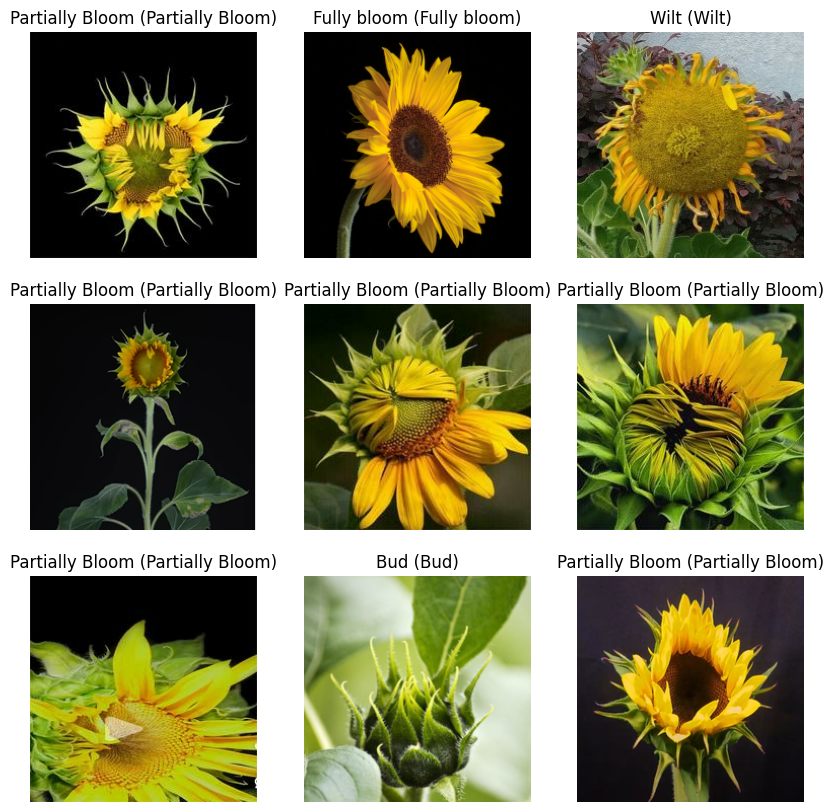

In [98]:
# View the predictions by the model
images, labels = next(iter(test_dataset))
predictions = model_Adam_unfreeze_25.predict(images)
class_names = ['Bud', 'Partially Bloom', 'Fully bloom', 'Wilt']

plt.figure(figsize = (10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(f'{class_names[predictions[i].argmax()]} ({class_names[labels[i]]})')
    plt.axis('off')
plt.show()

In [103]:
# Get data of test accuracies of unfreeze 0%, 10%, 15%, 20% and 25%
test_accuracies = []
with open('/tmp/test_histories_10_epochs.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == 'Adam, freeze 100%, with data augmentation' or row[0] == 'Adam, unfreeze 10%, with data augmentation' or row[0] == 'Adam, unfreeze 15%, with data augmentation' or row[0] == 'Adam, unfreeze 20%, with data augmentation' or row[0] == 'Adam, unfreeze 25%, with data augmentation':
            test_accuracies.append(float(row[1]) * 100)

In [104]:
test_accuracies

[91.66666865348816,
 96.79487347602844,
 94.2307710647583,
 95.51281929016113,
 92.94871687889099]

In [105]:
# Get data of validation accuracies of unfreeze 0%, 10%, 15%, 20% and 25%
validation_accuracies = []

# Unfreeze 0%
with open('/tmp/histories_inception_V3_Adam_freeze_100.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# Unfreeze 10%
with open('/tmp/histories_inception_V3_Adam_unfreeze_10_epoch_10.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# Unfreeze 15%
with open('/tmp/histories_inception_V3_Adam_unfreeze_15_epoch_10.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# Unfreeze 20%
with open('/tmp/histories_inception_V3_Adam_unfreeze_20_epoch_10.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

# Unfreeze 25%
with open('/tmp/histories_inception_V3_Adam_unfreeze_25_epoch_10.csv', 'r') as file:
    csv_reader = csv.reader(file)
    header = next(csv_reader) # Skip header row
    for row in csv_reader:
        if row[0] == '10':
            validation_accuracies.append(float(row[3]) * 100)

In [106]:
validation_accuracies

[91.61290526390076,
 94.19354796409607,
 93.54838728904724,
 94.8387086391449,
 96.77419066429138]

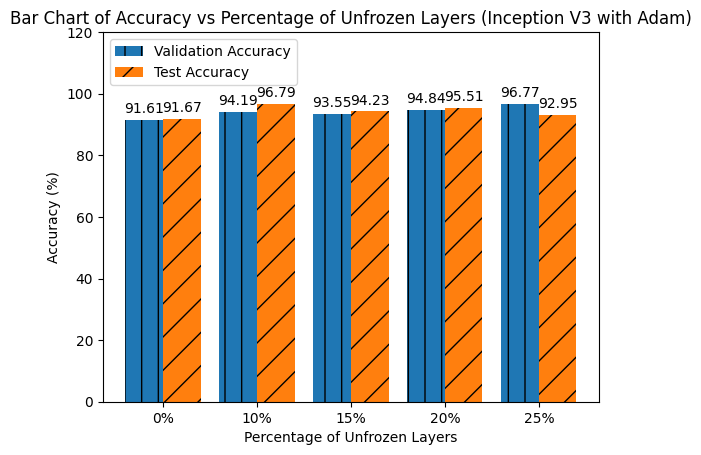

In [107]:
# Draw bar graph of validation and training accuracy vs percentage of unfreeze layers
# Reference 1: https://matplotlib.org/stable/gallery/lines_bars_and_markers/barchart.html
# Reference 2: https://python-graph-gallery.com/6-change-bars-texture/

percentage_unfreeze = ['0%', '10%', '15%', '20%', '25%']
accuracies = {
    'Validation Accuracy': validation_accuracies,
    'Test Accuracy': test_accuracies
}

x = np.arange(5)   # 5 items in x-axis
width = 0.4  # width of bars
multiplier = 0  # multiplier for offset (position of bar)

fig, ax = plt.subplots()

for attribute, accuracy in accuracies.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, accuracy, width, label=attribute)  # draw bar
    ax.bar_label(rects, padding=3, fmt='%.2f')  # label on top of bar
    if attribute == 'Validation Accuracy':
        for rect in rects:
            rect.set_hatch('|')   # add texture
    else:
        for rect in rects:
            rect.set_hatch('/')   # add texture
    multiplier += 1

ax.set_ylabel('Accuracy (%)')
ax.set_xlabel('Percentage of Unfrozen Layers')
ax.set_title('Bar Chart of Accuracy vs Percentage of Unfrozen Layers (Inception V3 with Adam)')
ax.set_xticks(x + (width/2), percentage_unfreeze)
ax.legend(loc='upper left')
ax.set_ylim(0, 120)

plt.show()